<a href="https://www.kaggle.com/code/mahmoudelshabrawy/wireless-eda-and-forcasting-lstm?scriptVersionId=197996484" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import plotly.express as px
from pylab import rcParams
import warnings
import seaborn as sns 
rcParams["figure.figsize"]=(30,18)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 15
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/ping-data/ping_data_rp59adf374.csv
/kaggle/input/ping-data/ping_data_rp829c7e0e.csv


In [44]:
df=pd.read_csv("/kaggle/input/ping-data/ping_data_rp59adf374.csv")
df

,timestamp,location,source,local_dest,local_avg,remote_dest,remote_avg
0,1.559041e+09,lower-level,wireless,192.168.0.1,4.39,142.254.217.53,9.09
1,1.559041e+09,lower-level,wireless,192.168.0.1,0.49,142.254.217.53,16.75
2,1.559041e+09,lower-level,wireless,192.168.0.1,0.56,142.254.217.53,8.31
3,1.559041e+09,lower-level,wireless,192.168.0.1,1.64,142.254.217.53,9.40
4,1.559041e+09,lower-level,wireless,192.168.0.1,1.18,142.254.217.53,9.07
...,...,...,...,...,...,...,...
72458,1.559691e+09,lower-level,wireless,192.168.0.1,0.83,142.254.217.53,7.85
72459,1.559691e+09,lower-level,wireless,192.168.0.1,0.84,142.254.217.53,8.88
72460,1.559691e+09,lower-level,wireless,192.168.0.1,5.73,142.254.217.53,10.92
72461,1.559691e+09,lower-level,wireless,192.168.0.1,0.19,142.254.217.53,10.00


In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72463 entries, 0 to 72462
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   timestamp    72463 non-null  float64
 1   location     72463 non-null  object 
 2   source       72463 non-null  object 
 3   local_dest   72463 non-null  object 
 4   local_avg    72463 non-null  float64
 5   remote_dest  72463 non-null  object 
 6   remote_avg   72463 non-null  float64
dtypes: float64(3), object(4)
memory usage: 3.9+ MB


In [46]:
df["source"].value_counts()

source
wireless    72463
Name: count, dtype: int64

In [47]:
df.drop(["source"] , axis = 1 , inplace=True)

In [48]:
df.isnull().sum()

timestamp      0
location       0
local_dest     0
local_avg      0
remote_dest    0
remote_avg     0
dtype: int64

In [49]:
df

,timestamp,location,local_dest,local_avg,remote_dest,remote_avg
0,1.559041e+09,lower-level,192.168.0.1,4.39,142.254.217.53,9.09
1,1.559041e+09,lower-level,192.168.0.1,0.49,142.254.217.53,16.75
2,1.559041e+09,lower-level,192.168.0.1,0.56,142.254.217.53,8.31
3,1.559041e+09,lower-level,192.168.0.1,1.64,142.254.217.53,9.40
4,1.559041e+09,lower-level,192.168.0.1,1.18,142.254.217.53,9.07
...,...,...,...,...,...,...
72458,1.559691e+09,lower-level,192.168.0.1,0.83,142.254.217.53,7.85
72459,1.559691e+09,lower-level,192.168.0.1,0.84,142.254.217.53,8.88
72460,1.559691e+09,lower-level,192.168.0.1,5.73,142.254.217.53,10.92
72461,1.559691e+09,lower-level,192.168.0.1,0.19,142.254.217.53,10.00


In [50]:
df["timestamp"]=pd.to_datetime(df['timestamp'] , unit='s')
df

,timestamp,location,local_dest,local_avg,remote_dest,remote_avg
0,2019-05-28 10:55:09.385333538,lower-level,192.168.0.1,4.39,142.254.217.53,9.09
1,2019-05-28 10:55:19.527390241,lower-level,192.168.0.1,0.49,142.254.217.53,16.75
2,2019-05-28 10:55:29.644651175,lower-level,192.168.0.1,0.56,142.254.217.53,8.31
3,2019-05-28 10:55:39.771213531,lower-level,192.168.0.1,1.64,142.254.217.53,9.40
4,2019-05-28 10:55:49.891722918,lower-level,192.168.0.1,1.18,142.254.217.53,9.07
...,...,...,...,...,...,...
72458,2019-06-04 23:24:19.402555704,lower-level,192.168.0.1,0.83,142.254.217.53,7.85
72459,2019-06-04 23:24:29.523201704,lower-level,192.168.0.1,0.84,142.254.217.53,8.88
72460,2019-06-04 23:24:39.660431385,lower-level,192.168.0.1,5.73,142.254.217.53,10.92
72461,2019-06-04 23:24:49.780297756,lower-level,192.168.0.1,0.19,142.254.217.53,10.00


In [51]:
df.set_index('timestamp', inplace=True)

In [52]:
df['local_avg'] = pd.to_numeric(df['local_avg'], errors='coerce')
df

,location,local_dest,local_avg,remote_dest,remote_avg
timestamp,,,,,
2019-05-28 10:55:09.385333538,lower-level,192.168.0.1,4.39,142.254.217.53,9.09
2019-05-28 10:55:19.527390241,lower-level,192.168.0.1,0.49,142.254.217.53,16.75
2019-05-28 10:55:29.644651175,lower-level,192.168.0.1,0.56,142.254.217.53,8.31
2019-05-28 10:55:39.771213531,lower-level,192.168.0.1,1.64,142.254.217.53,9.40
2019-05-28 10:55:49.891722918,lower-level,192.168.0.1,1.18,142.254.217.53,9.07
...,...,...,...,...,...
2019-06-04 23:24:19.402555704,lower-level,192.168.0.1,0.83,142.254.217.53,7.85
2019-06-04 23:24:29.523201704,lower-level,192.168.0.1,0.84,142.254.217.53,8.88
2019-06-04 23:24:39.660431385,lower-level,192.168.0.1,5.73,142.254.217.53,10.92


In [53]:
df["location"].value_counts()

location
lower-level    72463
Name: count, dtype: int64

In [54]:
df["local_dest"].value_counts()

local_dest
192.168.0.1    72463
Name: count, dtype: int64

In [55]:
df.drop(['location' ,'local_dest' ,'remote_dest'] ,axis=1 ,inplace=True )

In [56]:
daily_avg = df.resample('D').mean()

In [58]:
df

,local_avg,remote_avg
timestamp,,
2019-05-28 10:55:09.385333538,4.39,9.09
2019-05-28 10:55:19.527390241,0.49,16.75
2019-05-28 10:55:29.644651175,0.56,8.31
2019-05-28 10:55:39.771213531,1.64,9.40
2019-05-28 10:55:49.891722918,1.18,9.07
...,...,...
2019-06-04 23:24:19.402555704,0.83,7.85
2019-06-04 23:24:29.523201704,0.84,8.88
2019-06-04 23:24:39.660431385,5.73,10.92


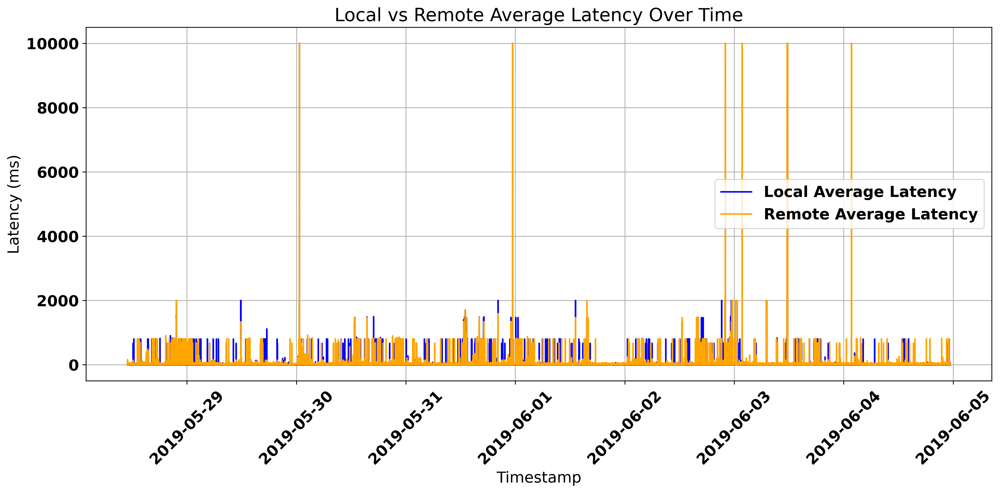

In [61]:
plt.figure(figsize=(14, 7))

plt.plot(df.index, df['local_avg'], label='Local Average Latency', color='blue')
plt.plot(df.index, df['remote_avg'], label='Remote Average Latency', color='orange')
plt.title('Local vs Remote Average Latency Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Latency (ms)')
plt.legend()
plt.xticks(rotation=45)
plt.grid()
plt.tight_layout()
plt.show()

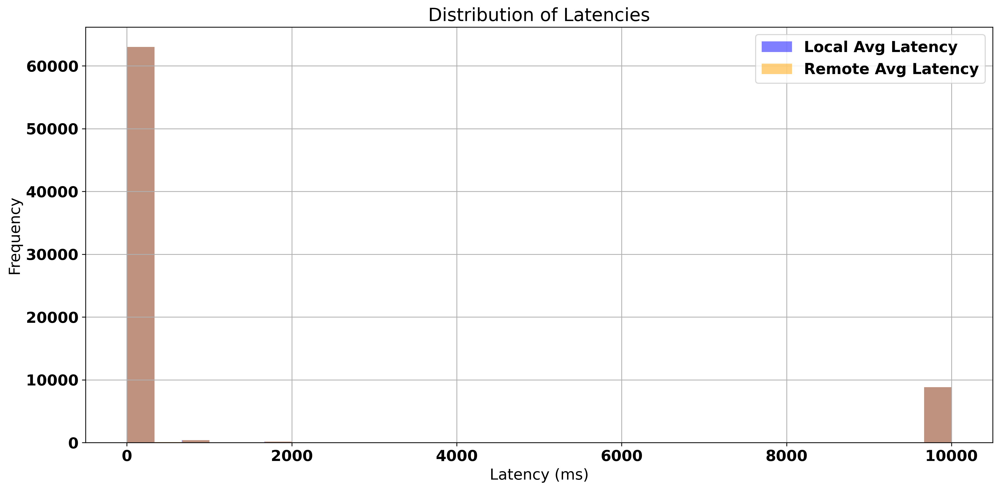

In [60]:
plt.figure(figsize=(14, 7))
plt.hist(df['local_avg'], bins=30, alpha=0.5, label='Local Avg Latency', color='blue')
plt.hist(df['remote_avg'], bins=30, alpha=0.5, label='Remote Avg Latency', color='orange')
plt.title('Distribution of Latencies')
plt.xlabel('Latency (ms)')
plt.ylabel('Frequency')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

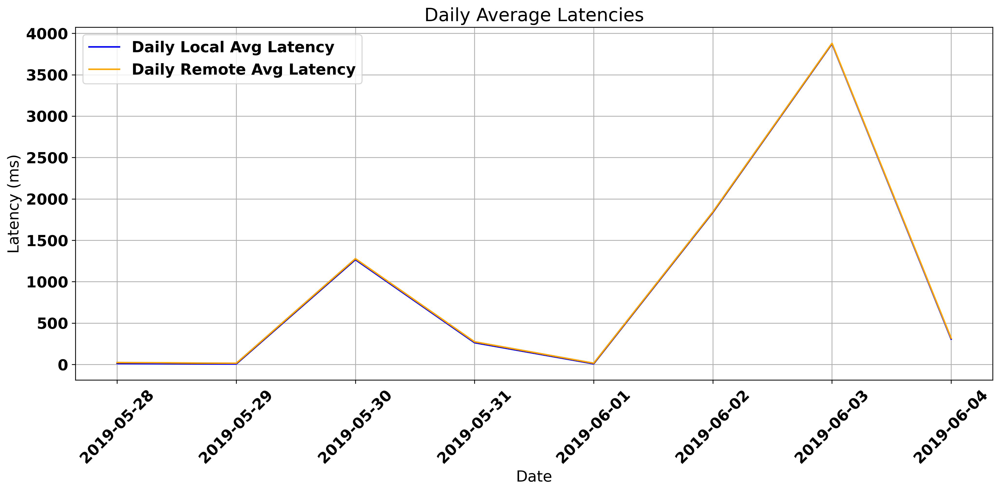

In [65]:
daily_avg = df.resample('D').mean()

plt.figure(figsize=(14, 7))
plt.plot(daily_avg.index, daily_avg['local_avg'], label='Daily Local Avg Latency', color='blue')
plt.plot(daily_avg.index, daily_avg['remote_avg'], label='Daily Remote Avg Latency', color='orange')
plt.title('Daily Average Latencies')
plt.xlabel('Date')
plt.ylabel('Latency (ms)')
plt.legend()
plt.xticks(rotation=45)
plt.grid()
plt.tight_layout()
plt.show()


In [66]:
df['hour'] = df.index.hour
df['day'] = df.index.day
df['month'] = df.index.month
df['weekday'] = df.index.weekday

In [67]:
df

,local_avg,remote_avg,hour,day,month,weekday
timestamp,,,,,,
2019-05-28 10:55:09.385333538,4.39,9.09,10,28,5,1
2019-05-28 10:55:19.527390241,0.49,16.75,10,28,5,1
2019-05-28 10:55:29.644651175,0.56,8.31,10,28,5,1
2019-05-28 10:55:39.771213531,1.64,9.40,10,28,5,1
2019-05-28 10:55:49.891722918,1.18,9.07,10,28,5,1
...,...,...,...,...,...,...
2019-06-04 23:24:19.402555704,0.83,7.85,23,4,6,1
2019-06-04 23:24:29.523201704,0.84,8.88,23,4,6,1
2019-06-04 23:24:39.660431385,5.73,10.92,23,4,6,1


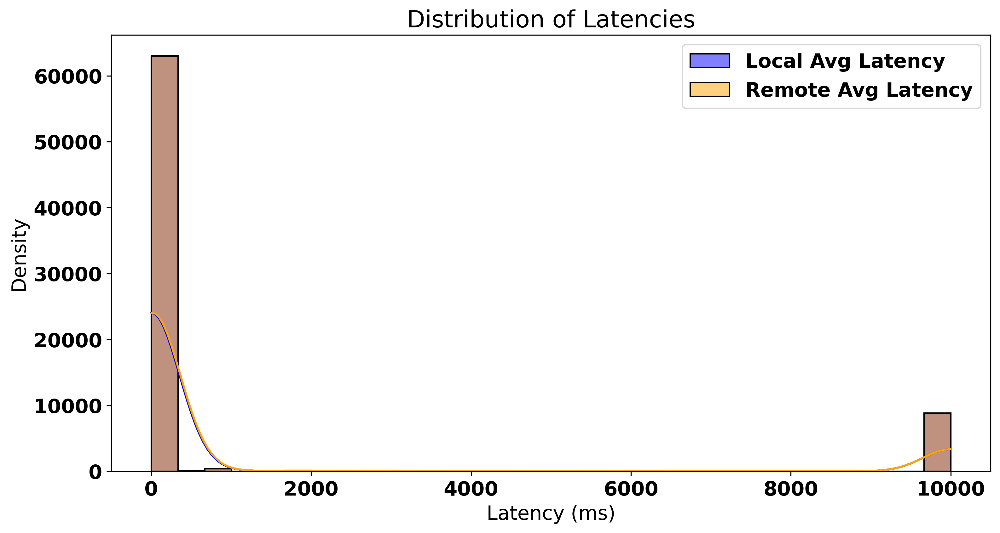

In [68]:
plt.figure(figsize=(12, 6))
sns.histplot(df['local_avg'], bins=30, color='blue', label='Local Avg Latency', kde=True)
sns.histplot(df['remote_avg'], bins=30, color='orange', label='Remote Avg Latency', kde=True)
plt.title('Distribution of Latencies')
plt.xlabel('Latency (ms)')
plt.ylabel('Density')
plt.legend()
plt.show()



In [71]:
hourly_avg = df.resample('H').mean()


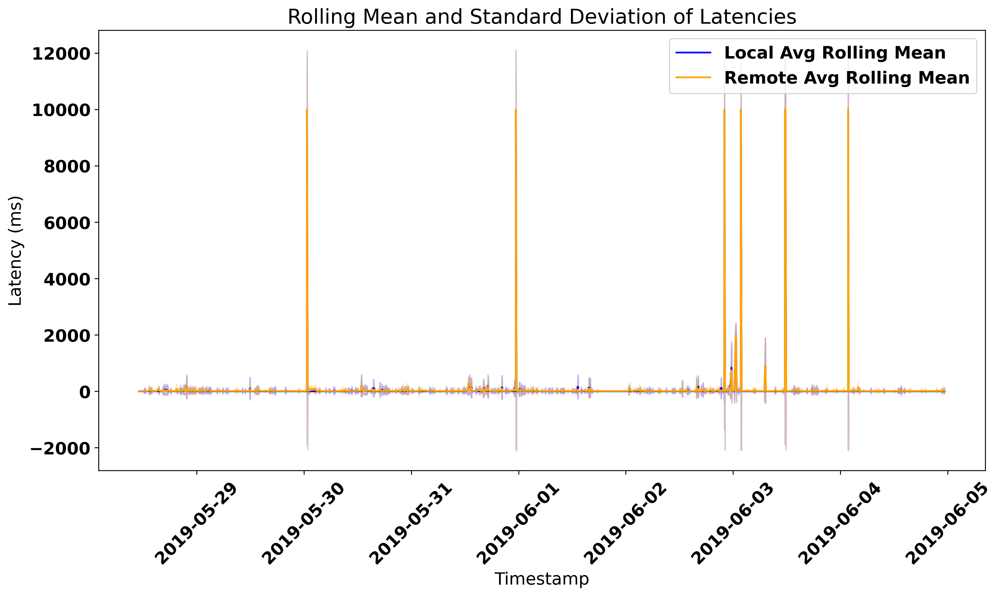

In [73]:
rolling_window = 60  

plt.figure(figsize=(14, 7))
plt.plot(df.index, df['local_avg'].rolling(window=rolling_window).mean(), label='Local Avg Rolling Mean', color='blue')
plt.fill_between(df.index, 
                 df['local_avg'].rolling(window=rolling_window).mean() - df['local_avg'].rolling(window=rolling_window).std(),
                 df['local_avg'].rolling(window=rolling_window).mean() + df['local_avg'].rolling(window=rolling_window).std(),
                 color='blue', alpha=0.2)
plt.plot(df.index, df['remote_avg'].rolling(window=rolling_window).mean(), label='Remote Avg Rolling Mean', color='orange')
plt.fill_between(df.index, 
                 df['remote_avg'].rolling(window=rolling_window).mean() - df['remote_avg'].rolling(window=rolling_window).std(),
                 df['remote_avg'].rolling(window=rolling_window).mean() + df['remote_avg'].rolling(window=rolling_window).std(),
                 color='orange', alpha=0.2)
plt.title('Rolling Mean and Standard Deviation of Latencies')
plt.xlabel('Timestamp')
plt.ylabel('Latency (ms)')
plt.legend()
plt.xticks(rotation=45)
plt.show()


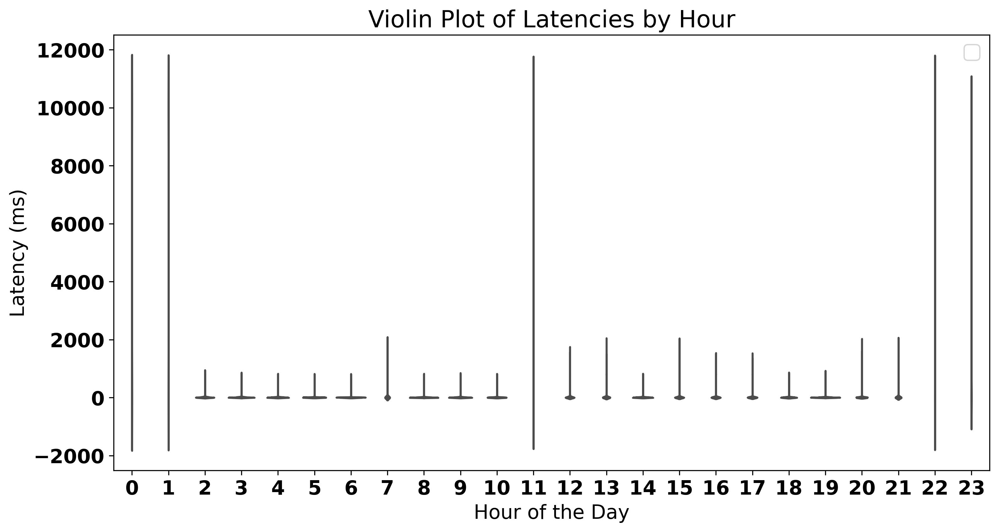

In [74]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='hour', y='local_avg', data=df, inner='quartile', color='blue', label='Local Avg')
sns.violinplot(x='hour', y='remote_avg', data=df, inner='quartile', color='orange', label='Remote Avg')
plt.title('Violin Plot of Latencies by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Latency (ms)')
plt.legend()
plt.show()


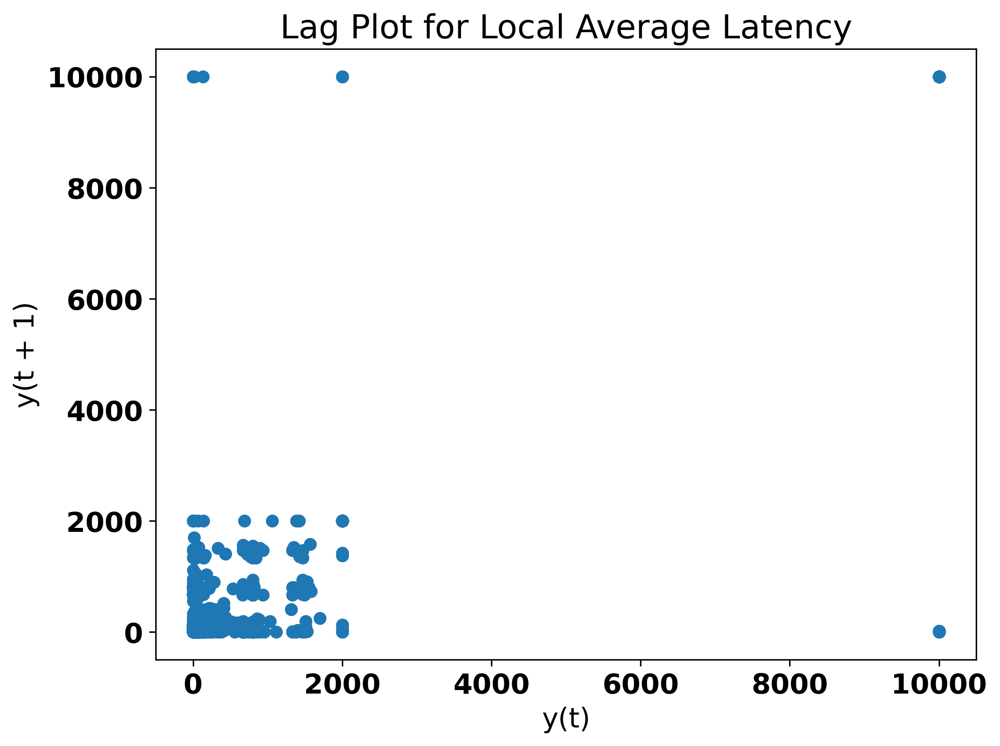

In [75]:
from pandas.plotting import lag_plot

plt.figure(figsize=(8, 6))
lag_plot(df['local_avg'])
plt.title('Lag Plot for Local Average Latency')
plt.show()


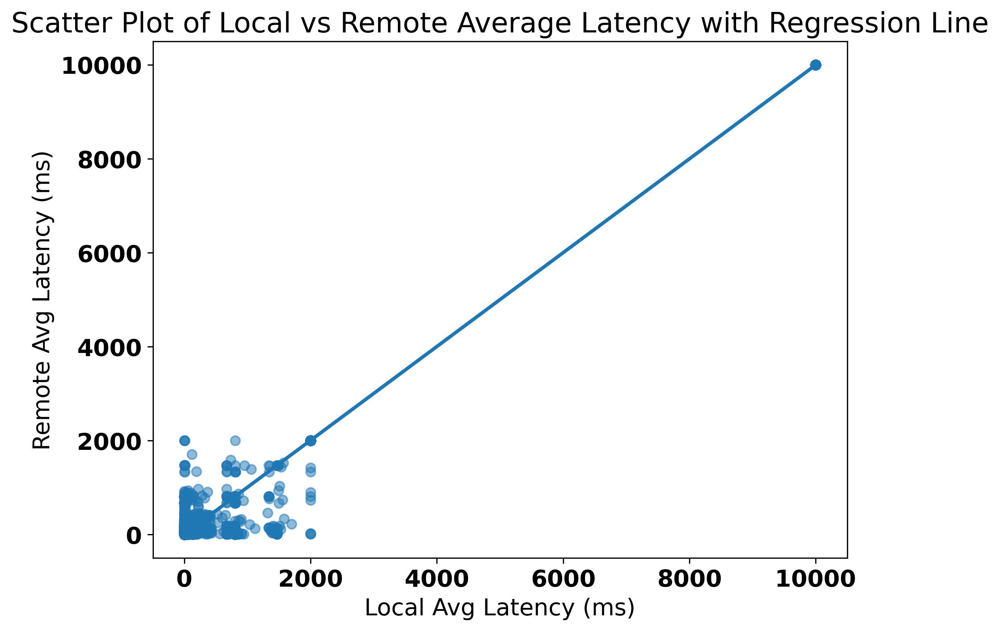

In [76]:
plt.figure(figsize=(8, 6))
sns.regplot(x='local_avg', y='remote_avg', data=df, scatter_kws={'alpha':0.5})
plt.title('Scatter Plot of Local vs Remote Average Latency with Regression Line')
plt.xlabel('Local Avg Latency (ms)')
plt.ylabel('Remote Avg Latency (ms)')
plt.show()


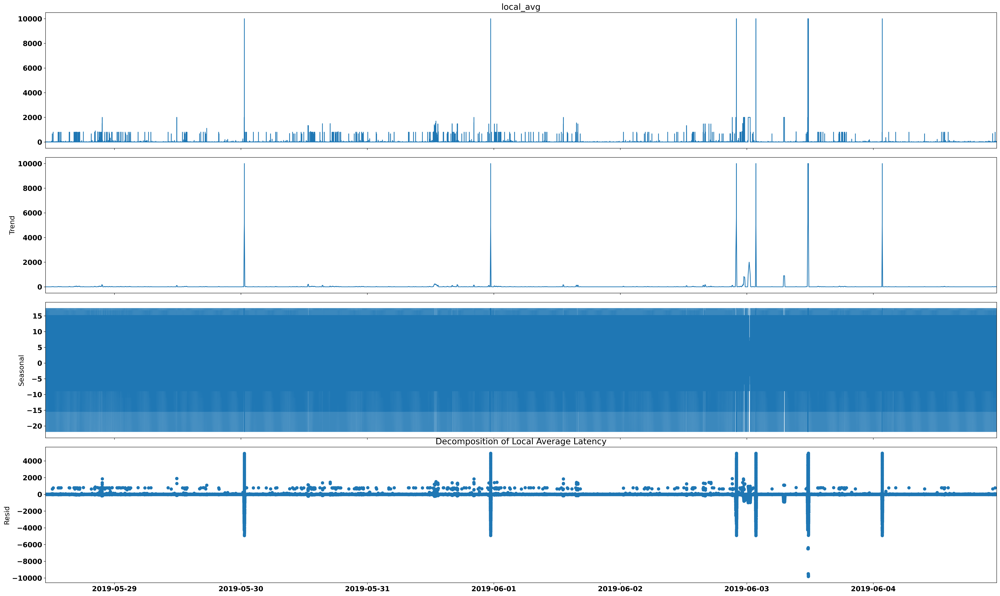

In [77]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(df['local_avg'], model='additive', period=60)  # assuming hourly data
fig = decomposition.plot()
plt.title('Decomposition of Local Average Latency')
plt.show()


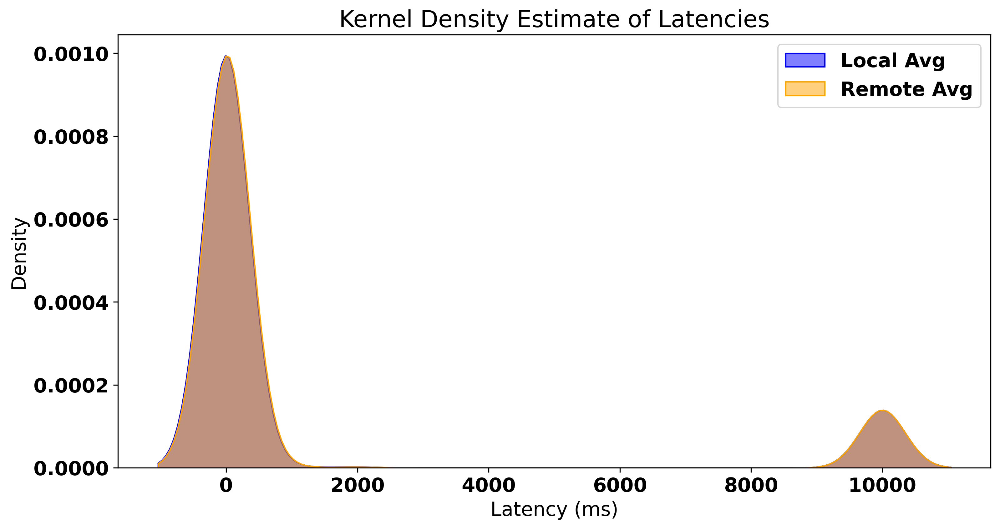

In [78]:
plt.figure(figsize=(12, 6))
sns.kdeplot(df['local_avg'], label='Local Avg', fill=True, color='blue', alpha=0.5)
sns.kdeplot(df['remote_avg'], label='Remote Avg', fill=True, color='orange', alpha=0.5)
plt.title('Kernel Density Estimate of Latencies')
plt.xlabel('Latency (ms)')
plt.ylabel('Density')
plt.legend()
plt.show()


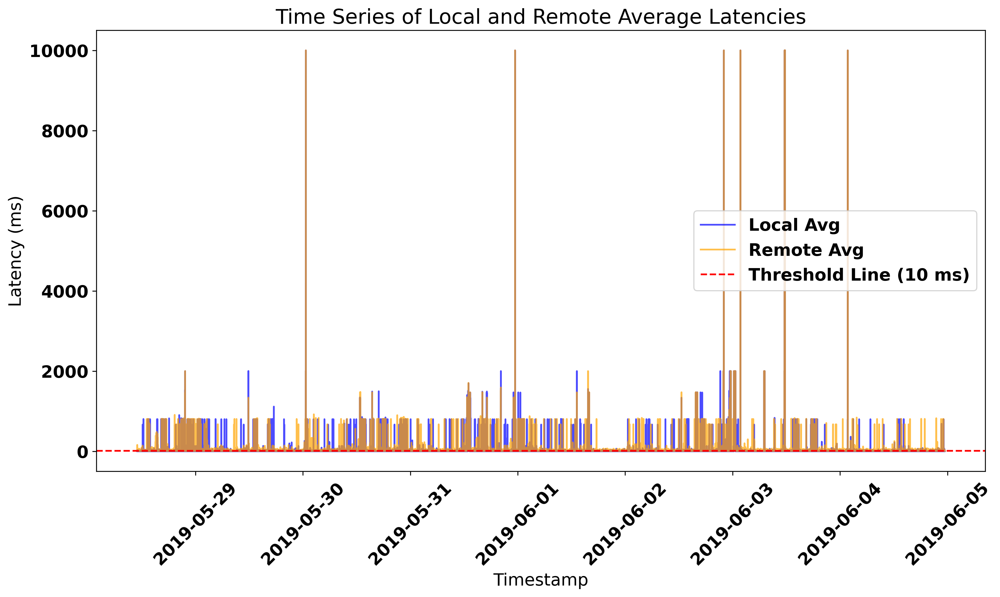

In [79]:
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['local_avg'], label='Local Avg', color='blue', alpha=0.7)
plt.plot(df.index, df['remote_avg'], label='Remote Avg', color='orange', alpha=0.7)
plt.title('Time Series of Local and Remote Average Latencies')
plt.xlabel('Timestamp')
plt.ylabel('Latency (ms)')
plt.axhline(y=10, color='red', linestyle='--', label='Threshold Line (10 ms)')
plt.legend()
plt.xticks(rotation=45)
plt.show()


In [80]:
from scipy import stats

t_statistic, p_value = stats.ttest_ind(df['local_avg'], df['remote_avg'])
print(f"T-test results:\nT-statistic: {t_statistic}\nP-value: {p_value}")

if p_value < 0.05:
    print("The difference between local and remote average latencies is statistically significant.")
else:
    print("The difference between local and remote average latencies is not statistically significant.")


T-test results:
T-statistic: -0.5677439777141692
P-value: 0.5702097045691619
The difference between local and remote average latencies is not statistically significant.


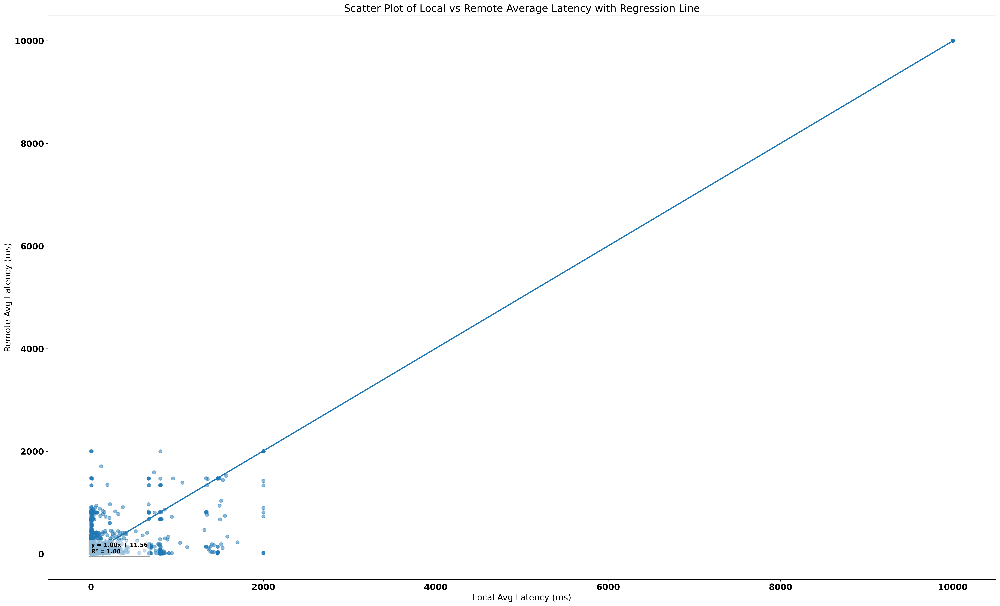

In [81]:
sns.regplot(x='local_avg', y='remote_avg', data=df, scatter_kws={'alpha':0.5})
plt.title('Scatter Plot of Local vs Remote Average Latency with Regression Line')

slope, intercept = np.polyfit(df['local_avg'], df['remote_avg'], 1)
plt.text(1, 12, f'y = {slope:.2f}x + {intercept:.2f}\nR² = {stats.pearsonr(df["local_avg"], df["remote_avg"])[0]**2:.2f}',
         fontsize=10, color='black', bbox=dict(facecolor='white', alpha=0.5))

plt.xlabel('Local Avg Latency (ms)')
plt.ylabel('Remote Avg Latency (ms)')
plt.show()


In [82]:
from scipy import stats

u_statistic, p_value = stats.mannwhitneyu(df['local_avg'], df['remote_avg'])
print(f"Mann-Whitney U Test results:\nU-statistic: {u_statistic}\nP-value: {p_value}")


Mann-Whitney U Test results:
U-statistic: 807841032.5
P-value: 0.0


In [84]:
# Shapiro-Wilk test for normality
shapiro_local = stats.shapiro(df['local_avg'])
shapiro_remote = stats.shapiro(df['remote_avg'])
print(f"Shapiro-Wilk Test for Local Avg: {shapiro_local}")
print(f"Shapiro-Wilk Test for Remote Avg: {shapiro_remote}")



Shapiro-Wilk Test for Local Avg: ShapiroResult(statistic=0.3872567614989283, pvalue=1.2505488237893072e-158)
Shapiro-Wilk Test for Remote Avg: ShapiroResult(statistic=0.3883874708666948, pvalue=1.4360755288057666e-158)


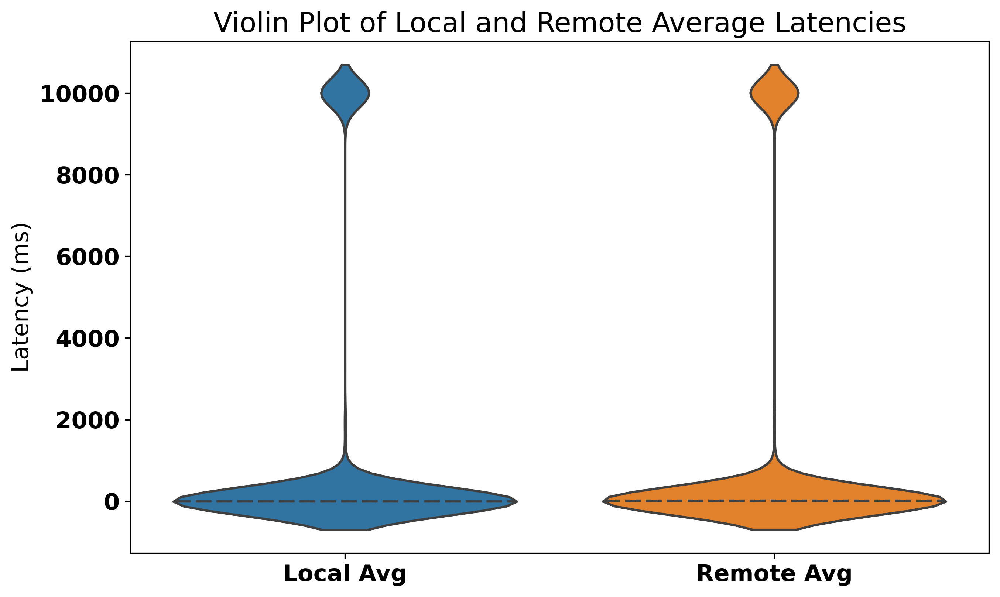

In [87]:

plt.figure(figsize=(10, 6))
sns.violinplot(data=df[['local_avg', 'remote_avg']], inner='quartile')
plt.title('Violin Plot of Local and Remote Average Latencies')
plt.ylabel('Latency (ms)')
plt.xticks([0, 1], ['Local Avg', 'Remote Avg'])
plt.show()


In [88]:
df

,local_avg,remote_avg,hour,day,month,weekday
timestamp,,,,,,
2019-05-28 10:55:09.385333538,4.39,9.09,10,28,5,1
2019-05-28 10:55:19.527390241,0.49,16.75,10,28,5,1
2019-05-28 10:55:29.644651175,0.56,8.31,10,28,5,1
2019-05-28 10:55:39.771213531,1.64,9.40,10,28,5,1
2019-05-28 10:55:49.891722918,1.18,9.07,10,28,5,1
...,...,...,...,...,...,...
2019-06-04 23:24:19.402555704,0.83,7.85,23,4,6,1
2019-06-04 23:24:29.523201704,0.84,8.88,23,4,6,1
2019-06-04 23:24:39.660431385,5.73,10.92,23,4,6,1


In [93]:
# Descriptive statistics
local_stats = df['local_avg'].describe()
remote_stats = df['remote_avg'].describe()

print("Descriptive Statistics for Local Average Latencies:")
print(local_stats)
print("\nDescriptive Statistics for Remote Average Latencies:")
print(remote_stats)


Descriptive Statistics for Local Average Latencies:
count    72463.000000
mean      1228.909344
std       3267.419743
min          0.150000
25%          0.310000
50%          0.730000
75%          2.000000
max       9999.999900
Name: local_avg, dtype: float64

Descriptive Statistics for Remote Average Latencies:
count    72463.000000
mean      1238.649549
std       3263.714778
min          2.350000
25%          8.700000
50%          9.550000
75%         13.310000
max       9999.999900
Name: remote_avg, dtype: float64


In [94]:
from scipy.stats import ttest_ind

t_stat, p_val = ttest_ind(df['local_avg'], df['remote_avg'])
print(f"T-test results: T-statistic = {t_stat}, P-value = {p_val}")


T-test results: T-statistic = -0.5677439777141692, P-value = 0.5702097045691619


In [95]:
import numpy as np
import scipy.stats as stats

def confidence_interval(data, confidence=0.95):
    mean = np.mean(data)
    std_err = stats.sem(data)
    h = std_err * stats.t.ppf((1 + confidence) / 2., len(data)-1)
    return mean - h, mean + h

local_ci = confidence_interval(df['local_avg'])
remote_ci = confidence_interval(df['remote_avg'])

print(f"95% Confidence Interval for Local Average Latencies: {local_ci}")
print(f"95% Confidence Interval for Remote Average Latencies: {remote_ci}")


95% Confidence Interval for Local Average Latencies: (1205.1189237820174, 1252.699764870122)
95% Confidence Interval for Remote Average Latencies: (1214.886104671705, 1262.4129932927729)


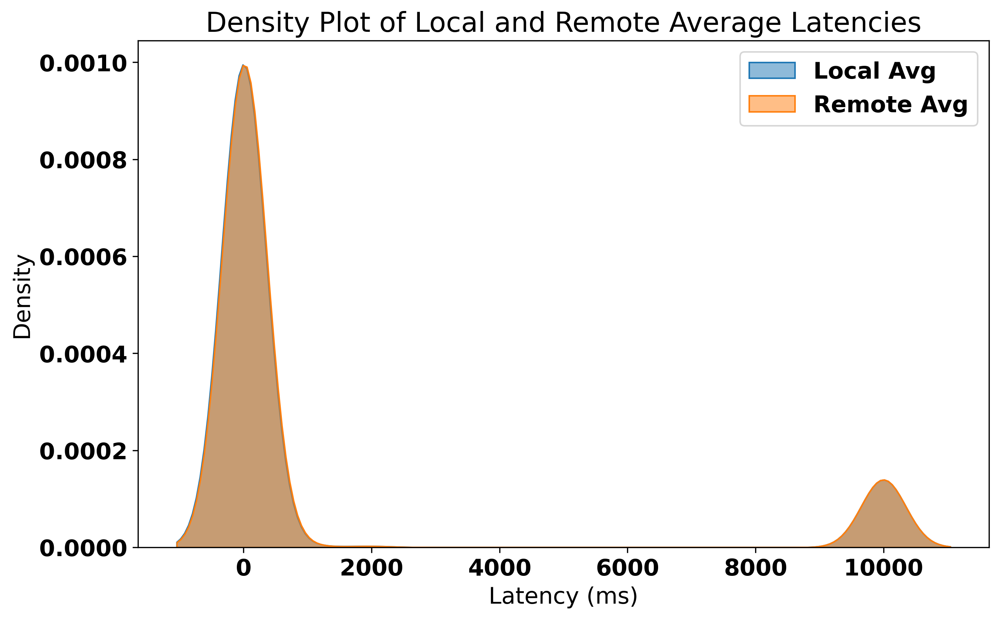

In [100]:
plt.figure(figsize=(10, 6))
sns.kdeplot(df['local_avg'], label='Local Avg', fill=True, alpha=0.5)
sns.kdeplot(df['remote_avg'], label='Remote Avg', fill=True, alpha=0.5)
plt.title('Density Plot of Local and Remote Average Latencies')
plt.xlabel('Latency (ms)')
plt.ylabel('Density')
plt.legend()
plt.show()


In [102]:
df['latency_difference'] = df['remote_avg'] - df['local_avg']

In [103]:
df['latency_difference'] = df['remote_avg'] - df['local_avg']

In [105]:
def categorize_latency(latency):
    if latency < 1:
        return 'Low'
    elif 1 <= latency < 5:
        return 'Medium'
    else:
        return 'High'

df['latency_category'] = df['local_avg'].apply(categorize_latency)

df

,local_avg,remote_avg,hour,day,month,weekday,latency_difference,latency_category
timestamp,,,,,,,,
2019-05-28 10:55:09.385333538,4.39,9.09,10,28,5,1,4.70,Medium
2019-05-28 10:55:19.527390241,0.49,16.75,10,28,5,1,16.26,Low
2019-05-28 10:55:29.644651175,0.56,8.31,10,28,5,1,7.75,Low
2019-05-28 10:55:39.771213531,1.64,9.40,10,28,5,1,7.76,Medium
2019-05-28 10:55:49.891722918,1.18,9.07,10,28,5,1,7.89,Medium
...,...,...,...,...,...,...,...,...
2019-06-04 23:24:19.402555704,0.83,7.85,23,4,6,1,7.02,Low
2019-06-04 23:24:29.523201704,0.84,8.88,23,4,6,1,8.04,Low
2019-06-04 23:24:39.660431385,5.73,10.92,23,4,6,1,5.19,High


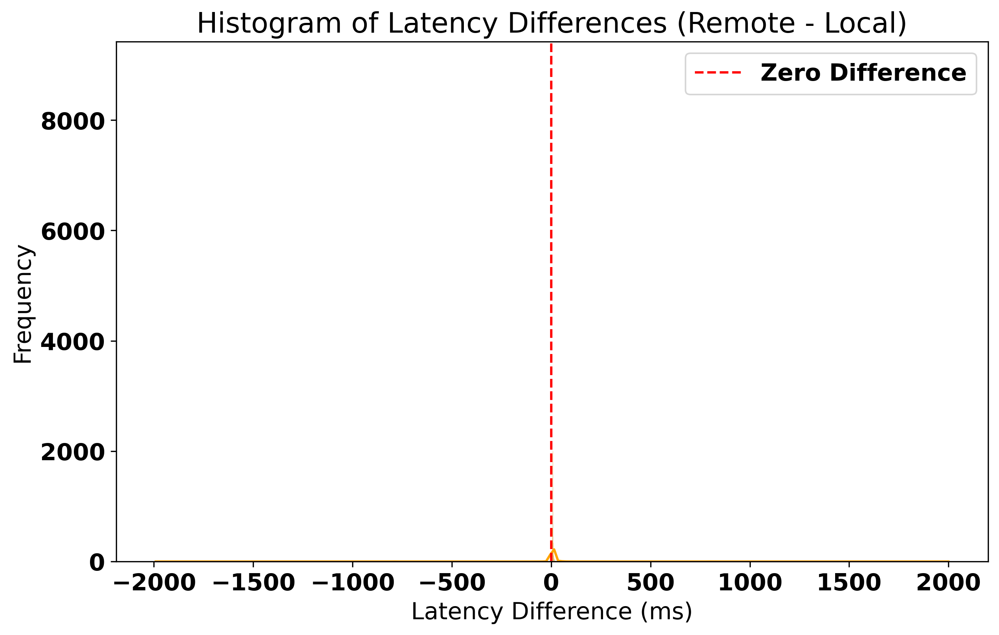

In [106]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.histplot(df['latency_difference'], kde=True, color='orange')
plt.title('Histogram of Latency Differences (Remote - Local)')
plt.xlabel('Latency Difference (ms)')
plt.ylabel('Frequency')
plt.axvline(x=0, color='red', linestyle='--', label='Zero Difference')
plt.legend()
plt.show()



In [107]:
anova_result = stats.f_oneway(
    df.loc[df['latency_category'] == 'Low', 'local_avg'],
    df.loc[df['latency_category'] == 'Medium', 'local_avg'],
    df.loc[df['latency_category'] == 'High', 'local_avg']
)

print(f"ANOVA results: F-statistic = {anova_result.statistic}, P-value = {anova_result.pvalue}")

category_stats = df.groupby('latency_category').agg({'local_avg': ['mean', 'count'], 'remote_avg': ['mean', 'count']})
category_stats

ANOVA results: F-statistic = 54941.590620285846, P-value = 0.0


local_avg          remote_avg       
                         mean  count         mean  count
latency_category                                        
High              6467.382753  13762  6455.995632  13762
Low                  0.418169  42637    13.838508  42637
Medium               1.774582  16064    19.846732  16064

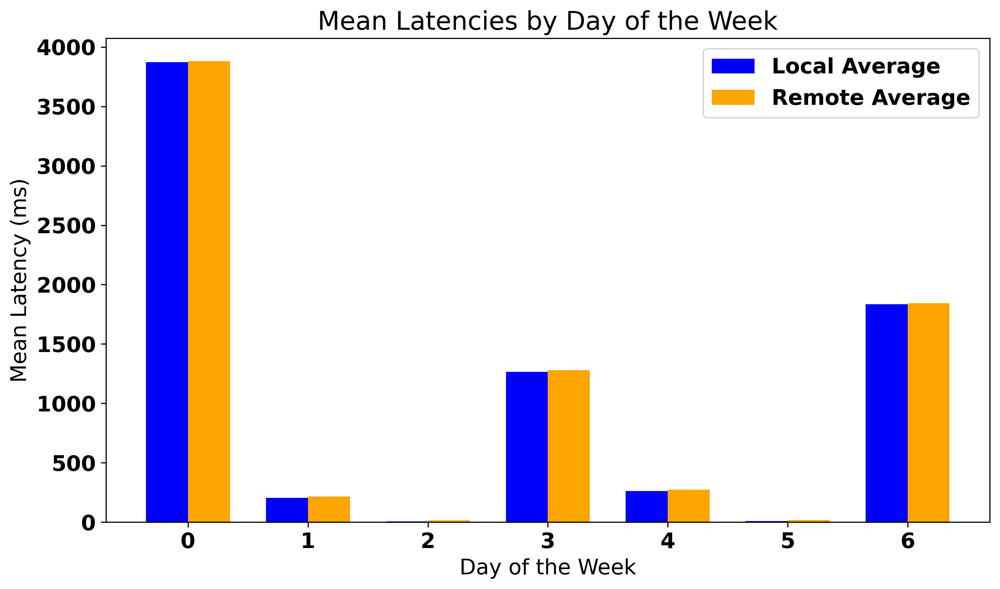

In [108]:
mean_latencies = df.groupby('weekday').agg({'local_avg': 'mean', 'remote_avg': 'mean'}).reset_index()
plt.figure(figsize=(10, 6))
bar_width = 0.35
x = mean_latencies['weekday']
plt.bar(x - bar_width/2, mean_latencies['local_avg'], width=bar_width, label='Local Average', color='blue')
plt.bar(x + bar_width/2, mean_latencies['remote_avg'], width=bar_width, label='Remote Average', color='orange')
plt.title('Mean Latencies by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Mean Latency (ms)')
plt.xticks(x)
plt.legend()
plt.tight_layout()
plt.show()

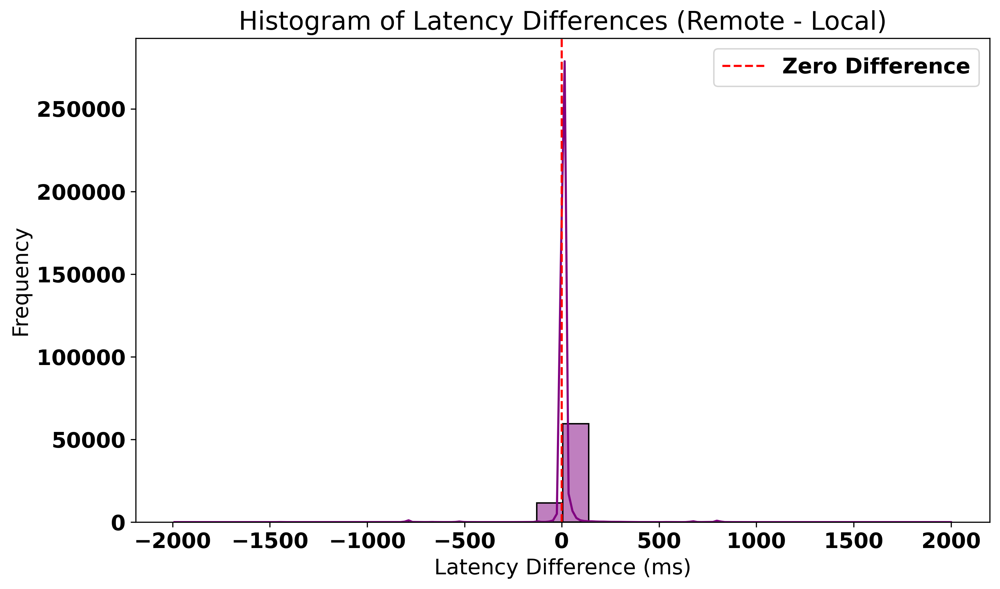

In [110]:
plt.figure(figsize=(10, 6))
sns.histplot(df['latency_difference'], kde=True, bins=30, color='purple')
plt.title('Histogram of Latency Differences (Remote - Local)')
plt.xlabel('Latency Difference (ms)')
plt.ylabel('Frequency')
plt.axvline(x=0, color='red', linestyle='--', label='Zero Difference')
plt.legend()
plt.tight_layout()
plt.show()


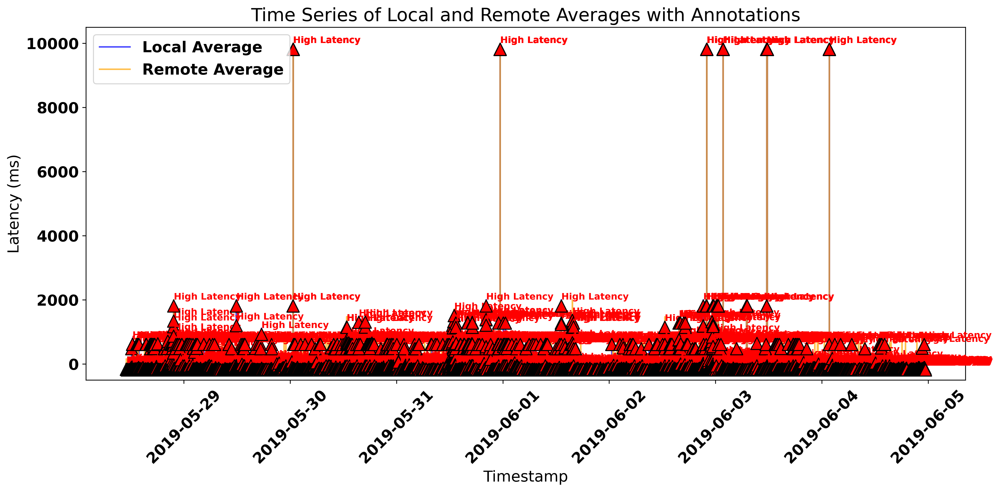

In [112]:
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['local_avg'], label='Local Average', color='blue', alpha=0.7)
plt.plot(df.index, df['remote_avg'], label='Remote Average', color='orange', alpha=0.7)
for i in range(len(df)):
    if df['latency_category'].iloc[i] == 'High':
        plt.annotate('High Latency', xy=(df.index[i], df['local_avg'].iloc[i]), 
                     xytext=(df.index[i], df['local_avg'].iloc[i]+5), 
                     arrowprops=dict(facecolor='red', shrink=0.05),
                     fontsize=9, color='red')
plt.title('Time Series of Local and Remote Averages with Annotations')
plt.xlabel('Timestamp')
plt.ylabel('Latency (ms)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


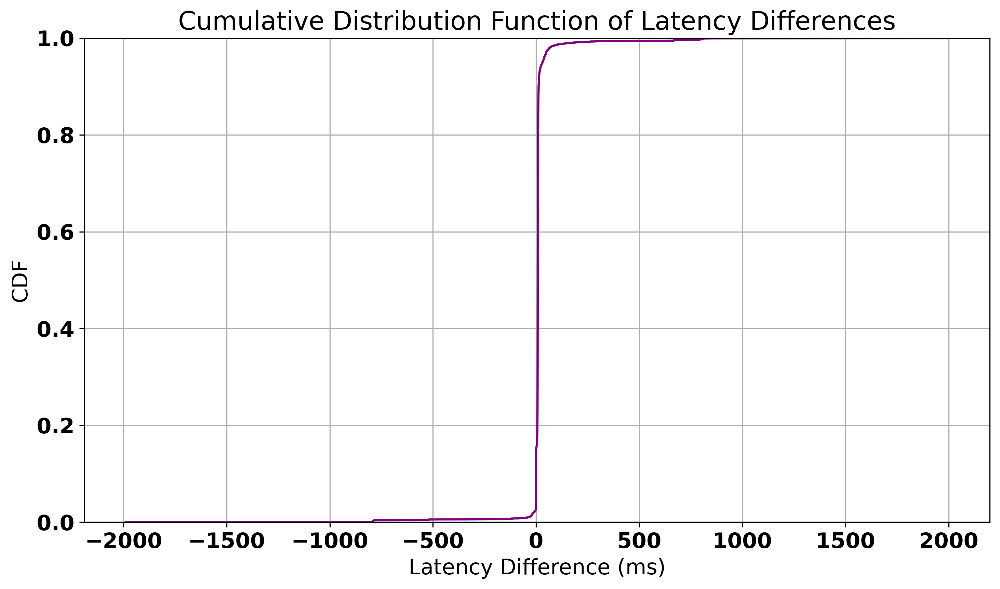

In [113]:
plt.figure(figsize=(10, 6))
sns.ecdfplot(df['latency_difference'], color='purple')
plt.title('Cumulative Distribution Function of Latency Differences')
plt.xlabel('Latency Difference (ms)')
plt.ylabel('CDF')
plt.grid()
plt.tight_layout()
plt.show()


In [114]:
df['quarter'] = df.index.quarter  
df['is_weekend'] = df['weekday'].apply(lambda x: 1 if x >= 5 else 0)  
df['latency_ratio'] = df['local_avg'] / df['remote_avg'] 
df['latency_sum'] = df['local_avg'] + df['remote_avg']  


In [115]:
low_latencies = df[df['latency_category'] == 'Low']['latency_difference']
medium_latencies = df[df['latency_category'] == 'Medium']['latency_difference']
high_latencies = df[df['latency_category'] == 'High']['latency_difference']

t_test_low_medium = stats.ttest_ind(low_latencies, medium_latencies)
t_test_low_high = stats.ttest_ind(low_latencies, high_latencies)
t_test_medium_high = stats.ttest_ind(medium_latencies, high_latencies)

print("T-test Low vs Medium: T-statistic =", t_test_low_medium.statistic, ", P-value =", t_test_low_medium.pvalue)
print("T-test Low vs High: T-statistic =", t_test_low_high.statistic, ", P-value =", t_test_low_high.pvalue)
print("T-test Medium vs High: T-statistic =", t_test_medium_high.statistic, ", P-value =", t_test_medium_high.pvalue)


T-test Low vs Medium: T-statistic = -10.25135317347643 , P-value = 1.224205104119604e-24
T-test Low vs High: T-statistic = 27.961339490910166 , P-value = 7.082802755642137e-171
T-test Medium vs High: T-statistic = 20.534620848795157 , P-value = 4.657122292228103e-93


In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='latency_category', y='latency_difference', data=df, palette='pastel')
plt.title('Box Plot of Latency Differences by Category')
plt.xlabel('Latency Category')
plt.ylabel('Latency Difference (ms)')
plt.grid()
plt.tight_layout()
plt.show()


In [117]:
df['rolling_mean_local'] = df['local_avg'].rolling(window=60).mean() 
df['rolling_std_local'] = df['local_avg'].rolling(window=60).std()  


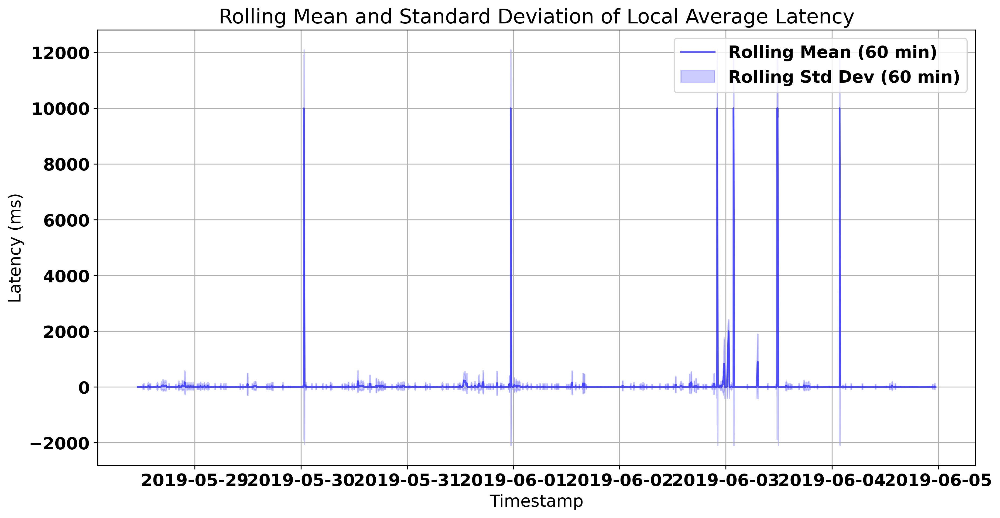

In [120]:
plt.figure(figsize=(14, 7))
plt.plot(df['rolling_mean_local'], label='Rolling Mean (60 min)', color='blue', alpha=0.6)
plt.fill_between(df.index, df['rolling_mean_local'] - df['rolling_std_local'], 
                 df['rolling_mean_local'] + df['rolling_std_local'], color='blue', alpha=0.2, label='Rolling Std Dev (60 min)')
plt.title('Rolling Mean and Standard Deviation of Local Average Latency')
plt.xlabel('Timestamp')
plt.ylabel('Latency (ms)')
plt.legend()
plt.grid()
plt.show()


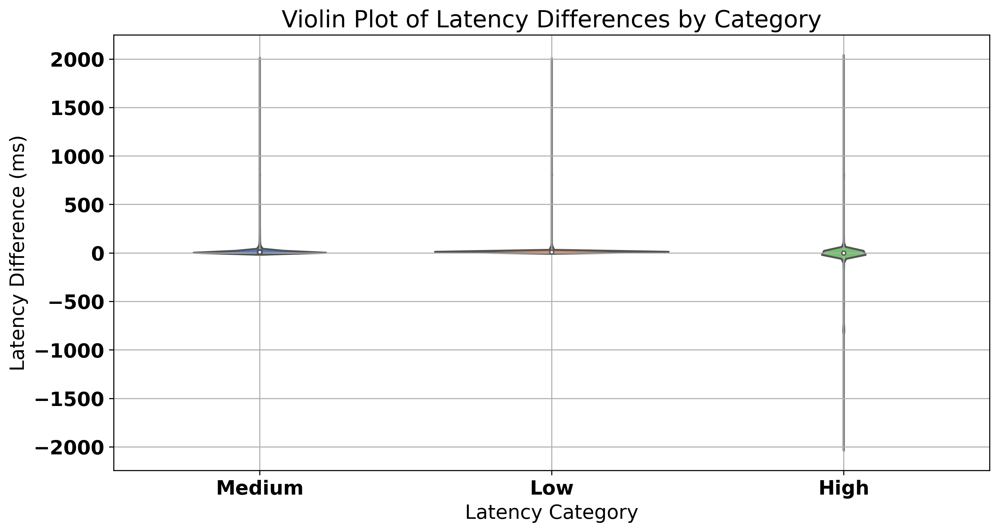

In [124]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='latency_category', y='latency_difference', data=df, palette='muted')
plt.title('Violin Plot of Latency Differences by Category')
plt.xlabel('Latency Category')
plt.ylabel('Latency Difference (ms)')
plt.grid()
plt.show()


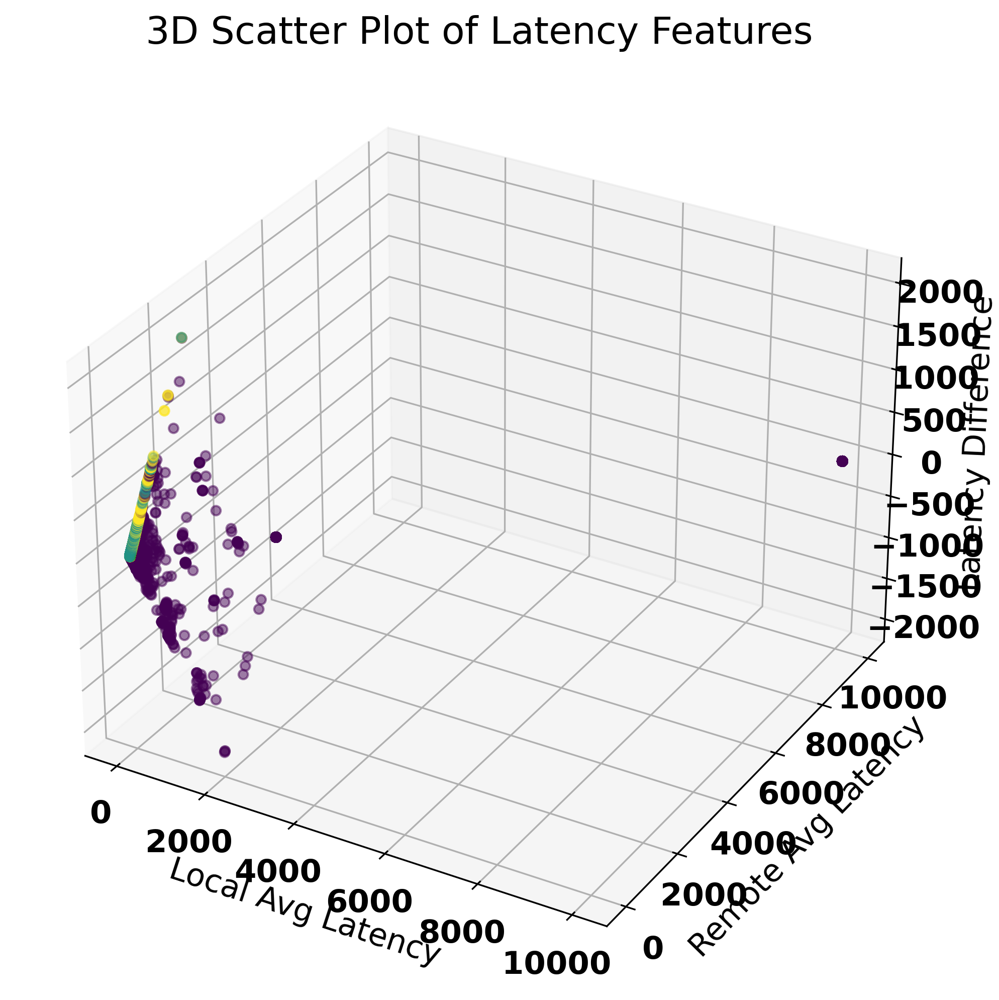

In [125]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['local_avg'], df['remote_avg'], df['latency_difference'], c=df['latency_category'].astype('category').cat.codes, cmap='viridis', alpha=0.5)
ax.set_xlabel('Local Avg Latency')
ax.set_ylabel('Remote Avg Latency')
ax.set_zlabel('Latency Difference')
plt.title('3D Scatter Plot of Latency Features')
plt.show()


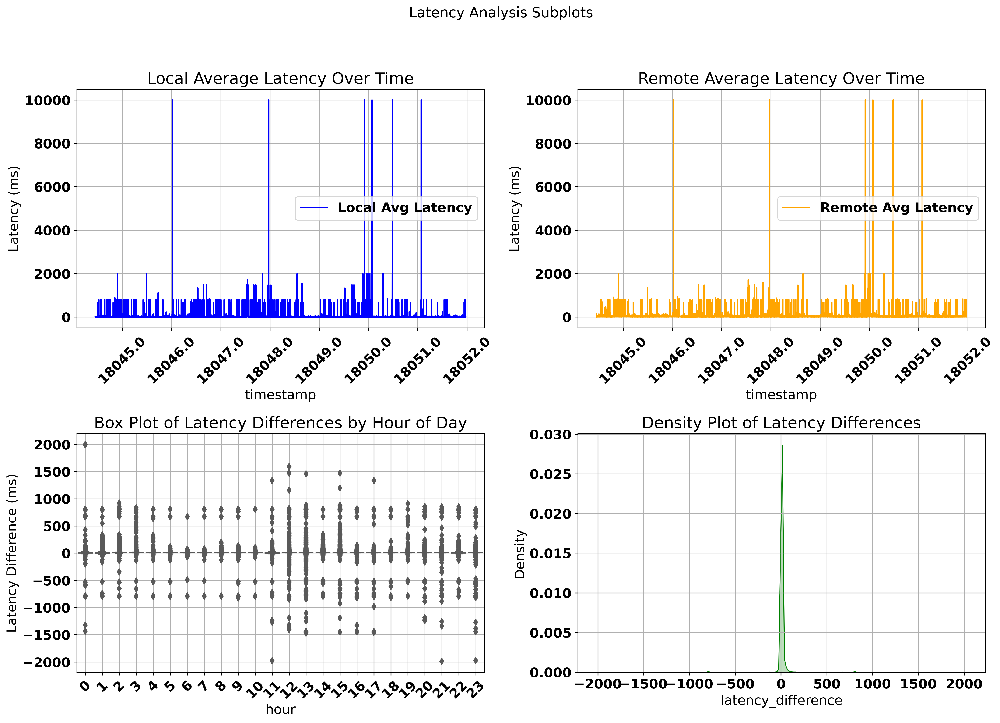

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Latency Analysis Subplots', fontsize=16)

sns.lineplot(ax=axes[0, 0], data=df, x='timestamp', y='local_avg', color='blue', label='Local Avg Latency')
axes[0, 0].set_title('Local Average Latency Over Time')
axes[0, 0].set_ylabel('Latency (ms)')
axes[0, 0].legend()
axes[0, 0].grid()
axes[0, 0].set_xticklabels(axes[0, 0].get_xticks(), rotation=45)

sns.lineplot(ax=axes[0, 1], data=df, x='timestamp', y='remote_avg', color='orange', label='Remote Avg Latency')
axes[0, 1].set_title('Remote Average Latency Over Time')
axes[0, 1].set_ylabel('Latency (ms)')
axes[0, 1].legend()
axes[0, 1].grid()
axes[0, 1].set_xticklabels(axes[0, 1].get_xticks(), rotation=45)

sns.boxplot(ax=axes[1, 0], x='hour', y='latency_difference', data=df, palette='Set2')
axes[1, 0].set_title('Box Plot of Latency Differences by Hour of Day')
axes[1, 0].set_ylabel('Latency Difference (ms)')
axes[1, 0].grid()
axes[1, 0].set_xticklabels(axes[1, 0].get_xticks(), rotation=45)

sns.kdeplot(ax=axes[1, 1], data=df, x='latency_difference', fill=True, color='green')
axes[1, 1].set_title('Density Plot of Latency Differences')
axes[1, 1].set_ylabel('Density')
axes[1, 1].grid()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


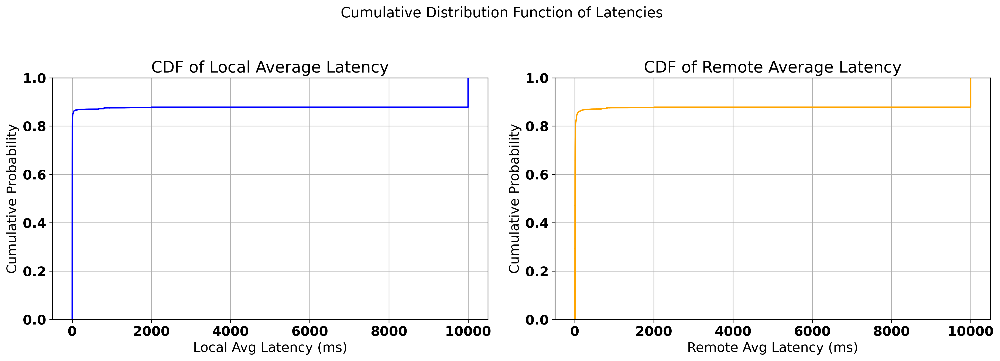

In [129]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Cumulative Distribution Function of Latencies', fontsize=16)

sns.ecdfplot(ax=axes[0], data=df, x='local_avg', color='blue')
axes[0].set_title('CDF of Local Average Latency')
axes[0].set_xlabel('Local Avg Latency (ms)')
axes[0].set_ylabel('Cumulative Probability')
axes[0].grid()

sns.ecdfplot(ax=axes[1], data=df, x='remote_avg', color='orange')
axes[1].set_title('CDF of Remote Average Latency')
axes[1].set_xlabel('Remote Avg Latency (ms)')
axes[1].set_ylabel('Cumulative Probability')
axes[1].grid()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


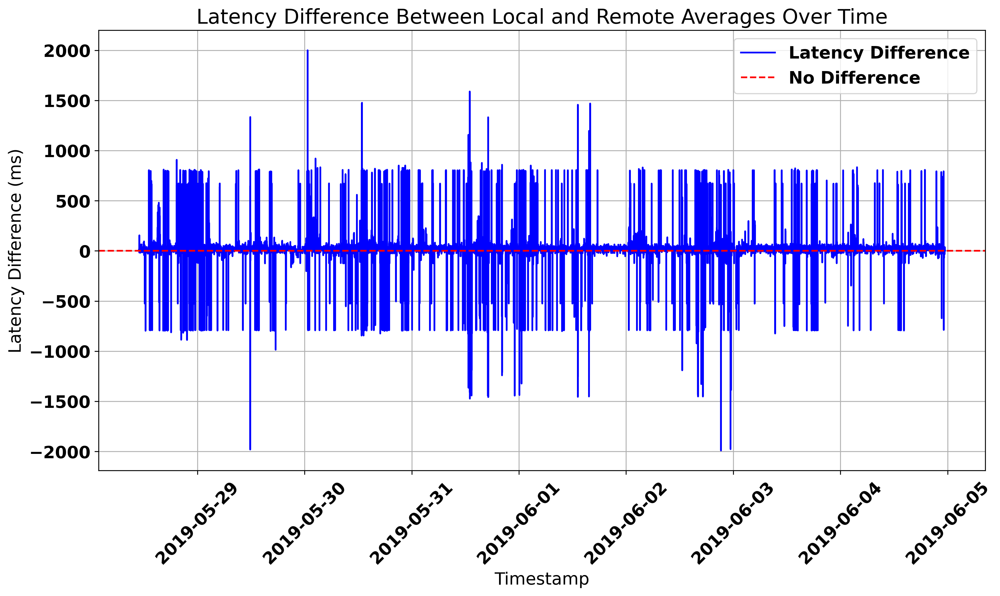

In [131]:
df['latency_difference'] = df['remote_avg'] - df['local_avg']

# Line plot of latency differences over time
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['latency_difference'], color='blue', label='Latency Difference')
plt.axhline(0, color='red', linestyle='--', label='No Difference')
plt.title('Latency Difference Between Local and Remote Averages Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Latency Difference (ms)')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.show()


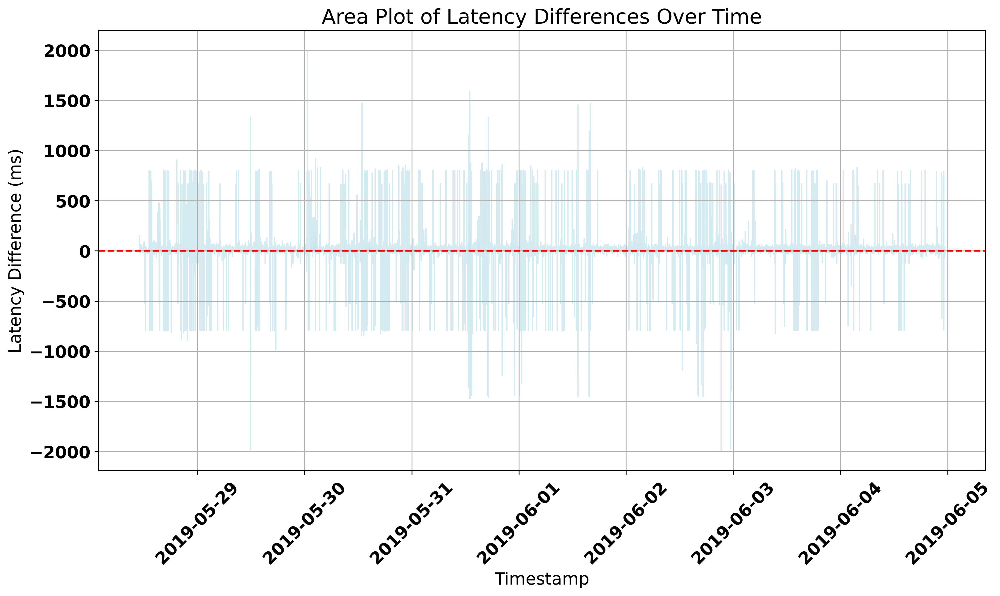

In [134]:
plt.figure(figsize=(14, 7))
plt.fill_between(df.index, df['latency_difference'], color='lightblue', alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.title('Area Plot of Latency Differences Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Latency Difference (ms)')
plt.xticks(rotation=45)
plt.grid()
plt.show()


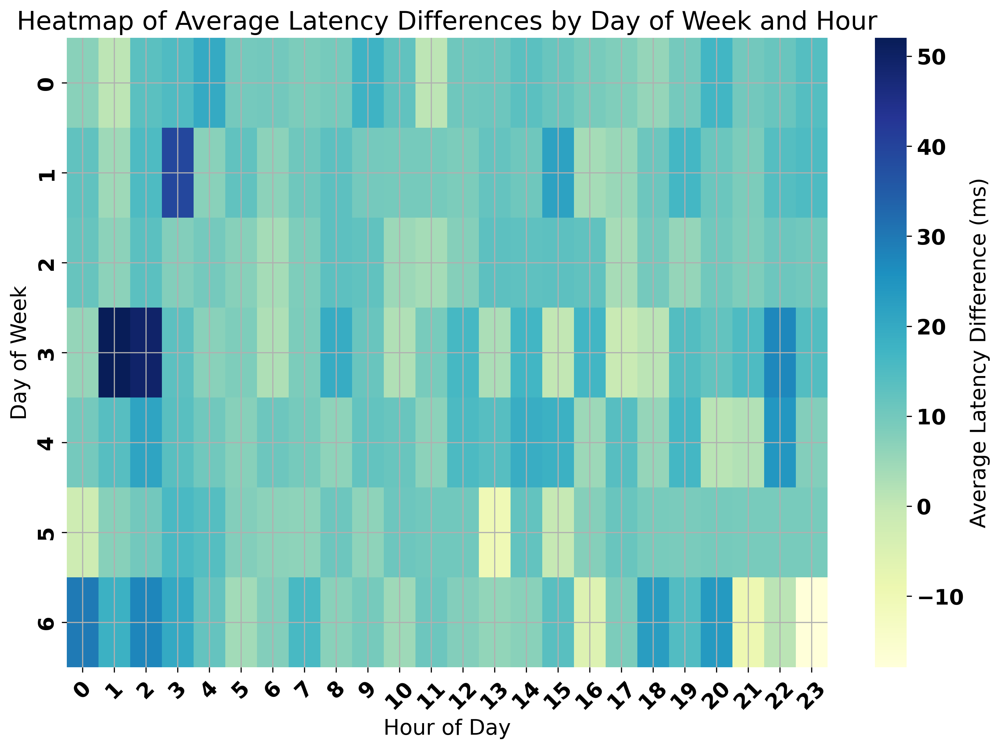

In [136]:
heatmap_data = df.pivot_table(index='weekday', columns='hour', values='latency_difference', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', fmt=".1f", cbar_kws={'label': 'Average Latency Difference (ms)'})
plt.title('Heatmap of Average Latency Differences by Day of Week and Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.xticks(rotation=45)
plt.grid()
plt.show()


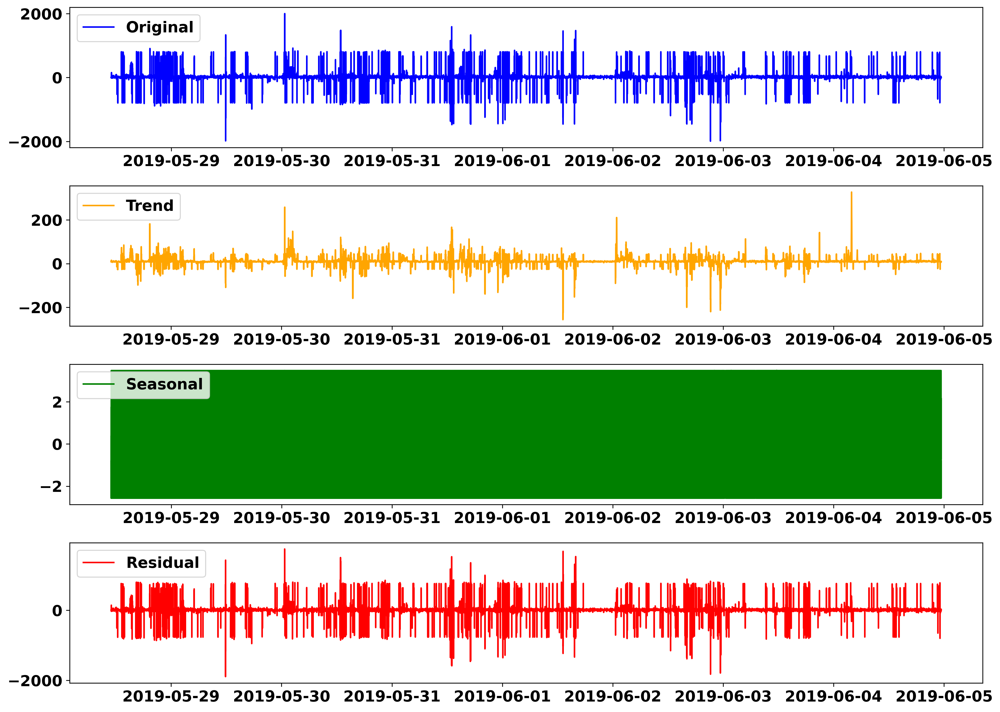

In [138]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(df['latency_difference'], model='additive', period=24)  # assuming hourly data
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.figure(figsize=(14, 10))
plt.subplot(411)
plt.plot(df.index, df['latency_difference'], label='Original', color='blue')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(df.index, trend, label='Trend', color='orange')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(df.index, seasonal, label='Seasonal', color='green')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(df.index, residual, label='Residual', color='red')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()


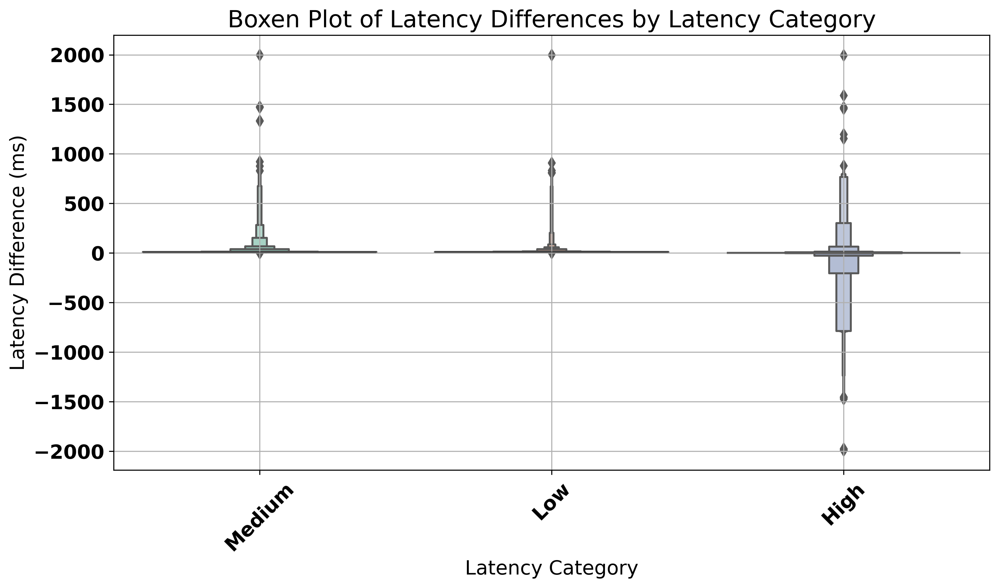

In [139]:
plt.figure(figsize=(12, 6))
sns.boxenplot(x='latency_category', y='latency_difference', data=df, palette='Set2')
plt.title('Boxen Plot of Latency Differences by Latency Category')
plt.xlabel('Latency Category')
plt.ylabel('Latency Difference (ms)')
plt.xticks(rotation=45)
plt.grid()
plt.show()


In [140]:
df

,local_avg,remote_avg,hour,day,month,weekday,latency_difference,latency_category,quarter,is_weekend,latency_ratio,latency_sum,rolling_mean_local,rolling_std_local,cumulative_latency_diff
timestamp,,,,,,,,,,,,,,,
2019-05-28 10:55:09.385333538,4.39,9.09,10,28,5,1,4.70,Medium,2,0,0.482948,13.48,NaN,NaN,4.70
2019-05-28 10:55:19.527390241,0.49,16.75,10,28,5,1,16.26,Low,2,0,0.029254,17.24,NaN,NaN,20.96
2019-05-28 10:55:29.644651175,0.56,8.31,10,28,5,1,7.75,Low,2,0,0.067389,8.87,NaN,NaN,28.71
2019-05-28 10:55:39.771213531,1.64,9.40,10,28,5,1,7.76,Medium,2,0,0.174468,11.04,NaN,NaN,36.47
2019-05-28 10:55:49.891722918,1.18,9.07,10,28,5,1,7.89,Medium,2,0,0.130099,10.25,NaN,NaN,44.36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-06-04 23:24:19.402555704,0.83,7.85,23,4,6,1,7.02,Low,2,0,0.105732,8.68,3.082000,7.284214,705773.77
2019-06-04 23:24:29.523201704,0.84,8.88,23,4,6,1,8.04,Low,2,0,0.094595,9.72,3.093167,7.280186,705781.81
2019-06-04 23:24:39.660431385,5.73,10.92,23,4,6,1,5.19,High,2,0,0.524725,16.65,3.185500,7.277873,705787.00


In [141]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split

In [234]:
features = df[['local_avg', 'remote_avg', 'latency_difference']].values

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_features = scaler.fit_transform(features)

scaled_df = pd.DataFrame(scaled_features, columns=['local_avg', 'remote_avg', 'latency_difference'], index=df.index)

In [254]:
scaled_df.to_csv("scaled_df.csv")

In [235]:
scaled_df

,local_avg,remote_avg,latency_difference
timestamp,,,
2019-05-28 10:55:09.385333538,0.000424,0.000674,0.499984
2019-05-28 10:55:19.527390241,0.000034,0.001440,0.502881
2019-05-28 10:55:29.644651175,0.000041,0.000596,0.500748
2019-05-28 10:55:39.771213531,0.000149,0.000705,0.500751
2019-05-28 10:55:49.891722918,0.000103,0.000672,0.500783
...,...,...,...
2019-06-04 23:24:19.402555704,0.000068,0.000550,0.500565
2019-06-04 23:24:29.523201704,0.000069,0.000653,0.500821
2019-06-04 23:24:39.660431385,0.000558,0.000857,0.500107


In [253]:
df_hourly = scaled_df.resample('T').mean()
df_hourly.to_csv("df_hourly.csv")

In [239]:
def create_dataset(data, time_step=1, target_column='remote_avg'):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data.iloc[i:(i + time_step), :].values)  # Convert to NumPy array
        y.append(data.iloc[i + time_step][target_column])  # Get the target value using the column name
    return np.array(X), np.array(y)


time_step = 10
X, y = create_dataset(df_hourly, time_step)

X = X.reshape(X.shape[0], X.shape[1], X.shape[2])  



In [241]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)


In [242]:
X_train_scaled = scaler.fit_transform(X_train.reshape(-1, X_train.shape[2])).reshape(X_train.shape)
y_train_scaled = scaler.fit_transform(y_train.reshape(-1, 1))  # Normalize y as well


In [243]:
from keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping


In [244]:
model = Sequential()
model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2])))
model.add(Dropout(0.3))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.3))
model.add(Dense(units=1))

optimizer = Adam(learning_rate=0.0001)  
model.compile(optimizer=optimizer, loss='mean_squared_error')
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


In [245]:
history = model.fit(X_train_scaled, y_train_scaled, epochs=100, batch_size=8,
                    validation_data=(X_test, y_test), callbacks=[early_stopping])


Epoch 1/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 15s 11ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 2/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 3/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 8.4804e-04 - val_loss: 0.0027
Epoch 4/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 5.3407e-04 - val_loss: 0.0027
Epoch 5/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 7.6718e-04 - val_loss: 0.0026
Epoch 6/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 5.7533e-04 - val_loss: 0.0026
Epoch 7/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - loss: 0.0011 - val_loss: 0.0026
Epoch 9/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 0.0011 - val_loss: 0.0026
Epoch 10/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - loss: 3.8504e-04 - val_loss: 0.0026
Epoch 11/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 8.7856e-04 - val_loss: 0.0025
Epoch 12/100
1082/1082 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss

In [246]:
y_pred = model.predict(X_test)
#y_pred_inverse = scaler.inverse_transform(np.concatenate((np.zeros((y_pred.shape[0], 2)), y_pred), axis=1))[:, 2]
y_pred

68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


array([[0.00111432],
       [0.00088004],
       [0.00098256],
       ...,
       [0.0008154 ],
       [0.0005927 ],
       [0.00065556]], dtype=float32)

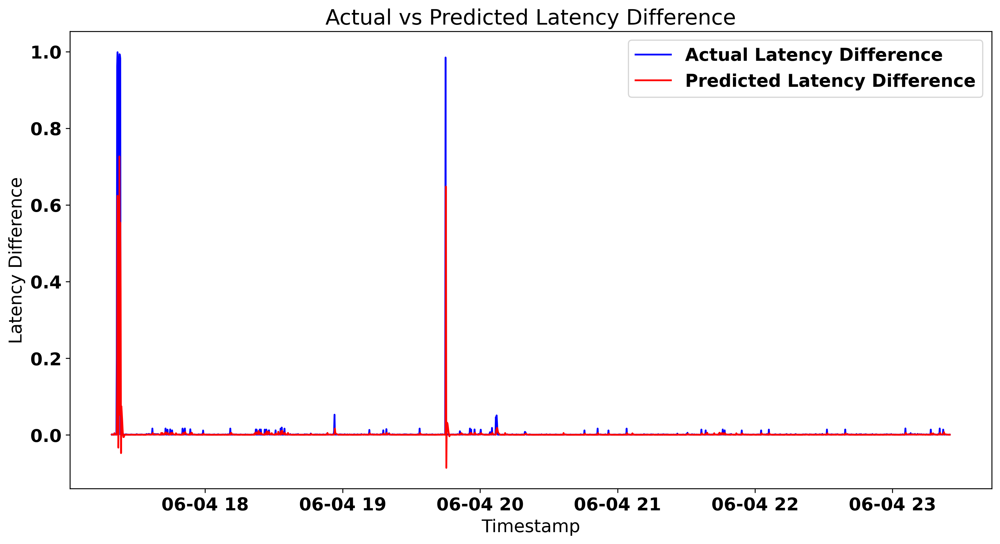

In [252]:
plt.figure(figsize=(14, 7))
plt.plot(df.index[-len(y_test):], y_test, color='blue', label='Actual Latency Difference')
plt.plot(df.index[-len(y_test):], y_pred, color='red', label='Predicted Latency Difference')
plt.title('Actual vs Predicted Latency Difference')
plt.xlabel('Timestamp')
plt.ylabel('Latency Difference')
plt.legend()
plt.show()


In [248]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)

print(f'Root Mean Squared Error: {rmse:.3f}')
print(f'Mean Absolute Error: {mae:.3f}')


Root Mean Squared Error: 0.044
Mean Absolute Error: 0.004


In [249]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error


In [250]:
y_pred = model.predict(X_test)


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


In [251]:
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print(f'R² Score: {r2}')
print(f'Mean Absolute Error: {mae}')

R² Score: 0.38818173785331045
Mean Absolute Error: 0.003999312115113512
